# Generative models; Autoencoders

## Autoencoder Networks

<b>Autoencoder</b> networks are designed to encode the date in a form of a <b>latent variables</b> vector and decode it in a form as close to the original data as possible:

[![](http://kvfrans.com/content/images/2016/08/autoenc.jpg)](http://kvfrans.com/variational-autoencoders-explained/)

We are training two networks at the same time - <b>encoder</b>), which maps data into a latent variables space $f: \mathbb{R}^d \to \mathbb{R}^k$, $z = f(x)$ and <b>decoder</b>, which reconstructs latents into the input space $\tilde{x} = g(z)$

Autoencoders have wide array of applications:

- They are effective compression tool.
- They might be used as an encryption method. 
- They are used to denoise data
- They are able to learn the non-trivial relationships between data.
- They are a perfect tool for dimensionality reduction and data embedding.
- They could be used as a generative model.


Training of autoencoders is pretty straightforward; we are minimizing a loss function: $L(x,g(f(x)))$. We could also regularize such models; by doing this we could enforce some specific properties on latent representation:

$$L(x,g(f(x))) + \Omega(z)$$

Regularized autoencoder is a generative model trained with a <i>Maximum Likelihood Estimation</i> (MLE) principle. In a probabilistic terms, we could write such model as:
$$p_{model}(x,z) = p_{model}(z)p_{model}(x|z)$$
where $p_{model}(z)$ is an a priori distribution of latent variables $z$.

In this framework decoder is represented as:

$$\log p_{model}(x) = \log \sum_z p_{model}(z)p_{model}(z,x)$$

And a training process is merely a maximization of the expression:

$$\log p_{model}(z,x) = \log p_{model}(z) + \log p_{model}(x|z)$$

But why autoencoders are so effective for the task of dimensionality reduction?

According to <b>Manifold hypothesis</b> the local relations between data are shaped by the low-dimensional manifolds embedded within the high-dimensional space:

[![](https://www.researchgate.net/profile/Y_Bengio/publication/221700451/figure/fig1/AS:305523212734474@1449853818623/Example-of-a-simple-manifold-in-the-space-of-images-associated-with-a-rather-low-level.png)](https://www.researchgate.net/figure/Example-of-a-simple-manifold-in-the-space-of-images-associated-with-a-rather-low-level_fig1_221700451/)



Let start with a simple example:

In [6]:
using Flux, MLDatasets
using Flux: mse, throttle, params, Statistics, @epochs
using Base.Iterators: partition
using Printf, BSON, LinearAlgebra
using Flux.Losses
using Plots; gr()
using CUDA

In [7]:
use_cuda = true

true

In [8]:
 if use_cuda && CUDA.functional()
    device = gpu
    @info "Training on GPU"
else
    device = cpu
    @info "Training on CPU"
end

┌ Info: Training on GPU
└ @ Main In[8]:3


In [9]:
X, y = MLDatasets.MNIST.traindata(Float32)
N, M = size(X, 3), 64
X = reshape(X,(28^2,N))
data = [X[:,i] for i in Iterators.partition(1:N,M)] |> device;

In [10]:
using Images

In [11]:
encoder = Chain(Dense(28^2, 256, leakyrelu),
                Dense(256, 32, leakyrelu))
    
decoder = Chain(Dense(32, 256, leakyrelu), 
                Dense(256, 28^2))

Chain(
  Dense(32, 256, leakyrelu),            # 8_448 parameters
  Dense(256, 784),                      # 201_488 parameters
)                   # Total: 4 arrays, 209_936 parameters, 820.312 KiB.

In [12]:
model = Chain(encoder, decoder) |> device
loss(x) = mse(model(x), x)
evalcb = throttle(() -> @show(loss(data[1])), 100)
opt = ADAM()

ADAM(0.001, (0.9, 0.999), 1.0e-8, IdDict{Any, Any}())

In [13]:
img(x::Vector) = Gray.(transpose(reshape(clamp.(x, 0, 1), 28, 28)))

function sample()
    before = [X[:,i] for i in rand(1:size(X,2), 4)] 
    after = map(x -> model(device(x)), before) |> cpu
    vcat(hcat.(img.(before), img.(after))...)
end

sample (generic function with 1 method)

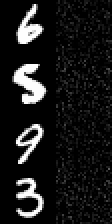

In [14]:
sample()

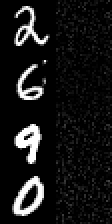

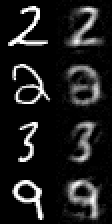

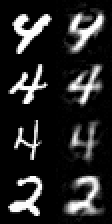

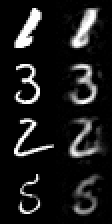

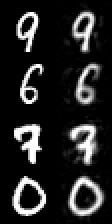

loss(data[1]) = 0.10700401f0


┌ Info: Beginning training loop...
└ @ Main In[15]:1
┌ Info: Epoch 1
└ @ Main In[15]:5
┌ Info: Epoch 2
└ @ Main In[15]:5
┌ Info: Epoch 3
└ @ Main In[15]:5
┌ Info: Epoch 4
└ @ Main In[15]:5
┌ Info: Epoch 5
└ @ Main In[15]:5


In [15]:
@info("Beginning training loop...")
best_ls = Inf
last_improvement = 0
for epoch = 1:5
    @info "Epoch $epoch"
    display(sample())
    global best_ls, last_improvement
    Flux.train!(loss, params(model), zip(data), opt, cb = evalcb)
    ls = loss(data[1])
    if ls <= best_ls
        BSON.@save "enc_dec.bson" model epoch
        best_ls = ls
        last_improvement = epoch
    end
    if epoch - last_improvement >= 2
        @warn(" -> We're calling this converged.")
        break
    end
end

In [16]:
BSON.@load "enc_dec.bson" model 

In [17]:
encoder(X[:,1])

32-element Vector{Float32}:
  0.3322395
  0.52908033
  0.173799
  0.19603063
  0.663274
  0.04448989
 -0.0029788776
 -0.00335485
  0.9628355
  0.27449018
  0.84491026
  0.39808938
  0.16599008
  ⋮
 -0.0021155428
 -0.0031871302
 -0.00554022
  0.23189151
  0.09108798
  0.31884676
 -0.00049783953
 -0.0037827294
  0.29170874
  0.27607685
  0.19689773
 -0.0026962908

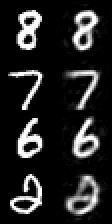

In [18]:
sample()

Simple autoencoder is an effective tool for the dimensionality reduction. But what to do if we want to generate new data?


##  Variational Autoencoders

[Variational Autoencoder](https://arxiv.org/pdf/1312.6114.pdf) (VAEs) is a type of generative models. Idea lying behind VAEs is pretty straightforward; instead of training the decoder to perfectly reconstruct the input, we are adding the randomness to the model, allowing for the minor alterations of the reconstructed data.

It is possible, because the model is learning not to represented the data points as a latent variables vectors, but as a probability (usually Gaussian) distributions:

[![](http://kvfrans.com/content/images/2016/08/vae.jpg)](http://kvfrans.com/variational-autoencoders-explained/)

How does it work?

We are interested in learning the probability distribution $p(x,z)$, which represents the relation between the latent variables and input data:

$$p(x,z) = p(x|z)p(z)$$

Giving this probability we could easily generate new datapoints:
1. Firstly by generating the values of latents: $z_i  \sim p(z)$
2. And then by generating new datapoint: $x_i \sim p(x|z)$

[![](https://i.stack.imgur.com/w0HP5.png)](https://arxiv.org/pdf/1312.6114.pdf)



In order to achieve that we must find a model able to effectively map the relationship between data $x$ and latent variables $z$:

$$p(z|x) = \frac{p(x|z)p(z)}{p(x)}$$

But the <i>evidence</i>: $p(x) = \int {p(x|z)p(z)}dz$ is intractable. We cannot find it value directly and also the Monte Carlo approximation is not effective in this case. So what we could do?


We could approximate $p(z|x)$ with a given probabiliy distribution $q_{\phi}(z|x)$, which belongs to the known probability distribution family $\phi$ (eg. Gaussian; then we must train the model to learn the parameters of such distribution: $\mu_{x_i},\sigma_{x_i}$).

Our goal then is to compute the value of:
$$E_{z \sim  q_{\phi}}[p(x | z)]$$ 


But how to measure the similarity of $q_{\phi}$ and $p$?


We could measure it with a  Kullback-Leibler divergence:

$$d_{KL}(q_{\phi}(z|x)||p(z|x)) = E_{q_{\phi}}[\log q_{\phi}(z|x)] - E_{q_{\phi}}[\log p(x,z)] + \log p(x)$$

We must find $q_{\phi}^*$ such that:

$$q_{\phi}^* = \underset{\phi}{\operatorname{argmin}}d_{KL}(q_{\phi}(z|x)||p(z|x))$$

But again, formula contains $p(x)$. How we could avoid calculating it?

We must define the <b>Evidence Lower BOund</b> (ELBO):

$$ELBO(\phi) = E_{q_{\phi}}[\log p(x,z)] -  E_{q_{\phi}}[\log q_{\phi}(z|x)]$$

Observe, that:

$$\log p(x) = ELBO(\phi) + d_{KL}(q_{\phi}(z|x)||p(z|x))$$

By the Jensen inequality Kullback-Leibler divergence is always non-negative, which means that the minimalization of its value is equivalent to maximization of ELBO.

Moreover, in VAEs latents are used only to represent a single point. As a result, we could compute ELBO for each point in the train set and aggregate the values:

$$ELBO(\theta,\psi)=\sum_{i=1}^n E_{q_{\phi}(z|x_i;\theta)}[\log p(x_i|z; \psi)] - \sum_{i=1}^n d_{KL}(q(z|x_i; \theta)||p(z))$$


Loss function is equal to:

$$L(\theta,\psi) = -\sum_{i=1}^n E_{q_{\phi}(z|x_i;\theta)}[\log p(x_i|z; \psi)] + \sum_{i=1}^n d_{KL}(q(z|x_i; \theta)||p(z))$$


From the neural net perspective VAEs are regularized autoencoders. Loss funtion is build from two elements: reconstruction loss $\sum_{i=1}^n E_{q_{\phi}(z|x_i;\theta)}[\log p(x_i|z; \psi)]$ and Kullback-Leibler divergence as a regularization term. 

Reconstrution loss ensures that the model is able to effectively map the data $x_i$ on the latent space $z_i$ and reconstruct it without loss of the quality. But if we train a model with only a recostruction loss model will overfit to train data and not be able to generate new observatons. As a result we must introduce the regularization term to ensure that model will be able to effectively cover the entire latent space:

[![](https://www.jeremyjordan.me/content/images/2018/03/Screen-Shot-2018-03-18-at-7.22.24-PM.png)](https://www.jeremyjordan.me/variational-autoencoders/)


As a result we get the perfect tool for [dimensionality reduction and embedding](https://www.deeplearningbook.org/contents/generative_models.html)

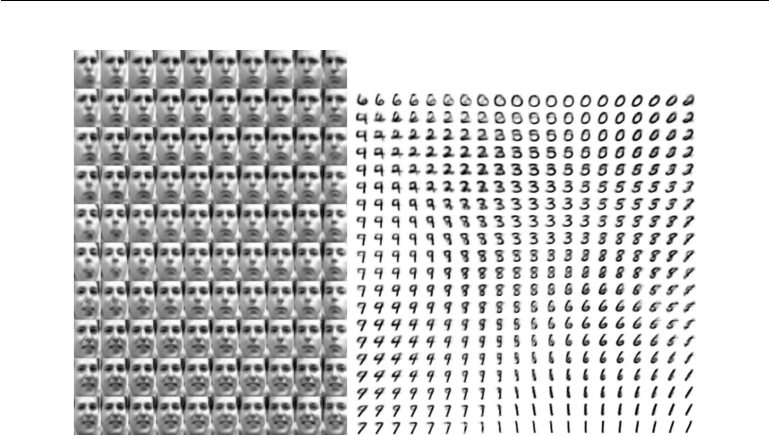

Let start with the model implementation:

In [19]:
X,y = MLDatasets.MNIST.traindata(Float32) 
N, M = size(X, 3), 64
X = reshape(X,(28^2,N)).> 0.5
data = [X[:,i] for i in Iterators.partition(1:N,M)] |> device;

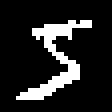

In [20]:
img(Float64.(X[:,1]))

Let define network:

In [21]:
Dz, Dh1, Dh2 = 2, 512, 256 #dimensions

(2, 512, 256)

In [22]:
encoder = Chain(Dense(28^2, Dh1, leakyrelu), Dense(Dh1,Dh2,leakyrelu)) |> device
    
μ = Dense(Dh2, Dz) |> device
lnσ = Dense(Dh2, Dz) |> device 
z(μ, logσ) = μ + exp.(logσ) .* device(randn(Float32,size(logσ)))

decoder = Chain(Dense(Dz, Dh2, leakyrelu),
                Dense(Dh2,Dh1),
                Dense(Dh1, 28^2)) |> device


Chain(
  Dense(2, 256, leakyrelu),             # 768 parameters
  Dense(256, 512),                      # 131_584 parameters
  Dense(512, 784),                      # 402_192 parameters
)                   # Total: 6 arrays, 534_544 parameters, 856 bytes.

and loss function:

In [23]:
# KL-divergence between approximation posterior and N(0, 1) prior
kl_q_p(μ, logσ) = 0.5f0 * sum(@. (exp(2f0 * logσ) + μ^2 -1f0 - 2f0 * logσ))

kl_q_p (generic function with 1 method)

In [24]:
# logp(x|z) - conditional probability of data given latents.
logp_x_z(x, z) = -sum(Losses.logitbinarycrossentropy.(decoder(z), x))

logp_x_z (generic function with 1 method)

In [25]:
function ELBO(X)
    μ̂, logσ̂ = μ(encoder(X)), lnσ(encoder(X))
    ẑ = z(μ̂, logσ̂ ) 
    (logp_x_z(X, ẑ) * 1 /size(X)[end]) - (kl_q_p(μ̂, logσ̂) * 1 /size(X)[end]) 
    
end

ELBO (generic function with 1 method)

In [26]:
 loss(X) = -ELBO(X)

loss (generic function with 1 method)

In [27]:
 loss(data[1])

543.84906f0

and auxiliary plots:

In [28]:
img(x::Vector) = Gray.(transpose(reshape(clamp.(x, 0, 1), 28, 28)))

function sample()
    batch = data[rand(1:length(data))]
    latents = encoder(batch)
    Z = z(μ(latents), lnσ(latents))
    decoded = decoder(Z)
    idx = rand(1:size(batch,2),4)
    before = [img(Float64.(cpu(batch[:,i]))) for i in idx] 
    after = [img(cpu(decoded[:,i])) for i in idx]
    vcat(hcat.(before, after)...)
end

sample (generic function with 1 method)

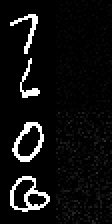

In [29]:
sample()

In [30]:
function scatter_plot(pltsize = 2000)
    plt = scatter(palette=:tab10)
    idxs = rand(1:size(X,2), pltsize)
    labels = y[idxs]
    batch = X[:,idxs] |> device
    μs = μ(encoder(batch)) |> cpu
    scatter!(μs[1, :], μs[2, :], 
            markerstrokewidth=0, markeralpha=0.8,
            aspect_ratio=1,
            markercolor=labels, label="")
end

scatter_plot (generic function with 2 methods)

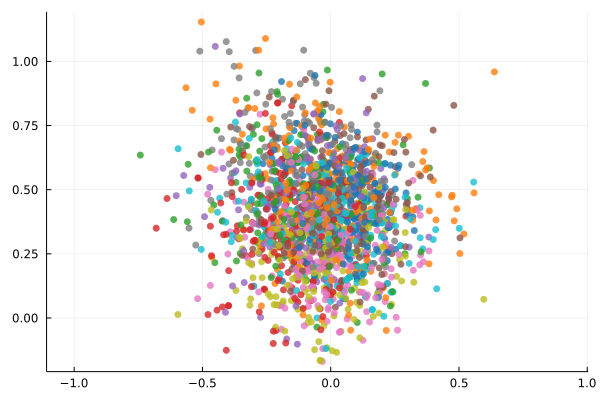

In [31]:
scatter_plot()

In [32]:
function manifold_plot(z = range(-2.0, stop=2.0, length=11))
    len = Base.length(z)
    z1 = repeat(z, len)
    z2 = sort(z1)
    input = hcat(z1,z2)' |> device
    samples = [decoder(input)[:,i] for i = 1:len^2] |> cpu
    samples = reshape(img.(samples), (len,len))
    vcat([hcat(samples[:,i]...) for i = 1:len]...)
end

manifold_plot (generic function with 2 methods)

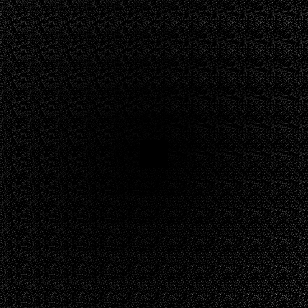

In [33]:
manifold_plot()

In [34]:
function display_plots()
    @show(loss(data[1]))
    display(scatter_plot())
    display(manifold_plot())
    display(sample())
end

display_plots (generic function with 1 method)

and finally, we could start a learning process:

In [35]:
evalcb = throttle(display_plots, 900)
opt = ADAM()
ps = params(encoder, μ, lnσ, decoder);

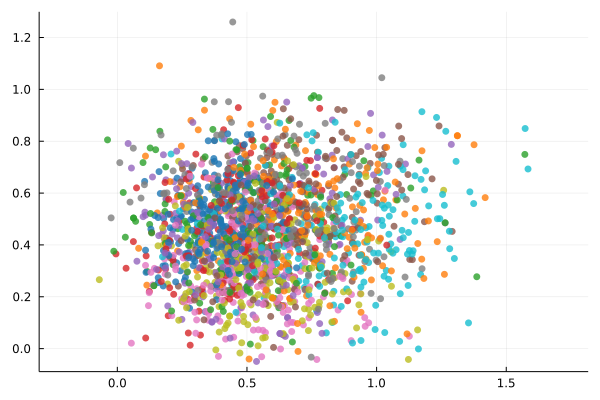

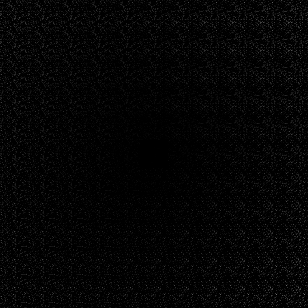

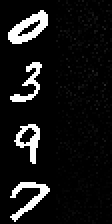

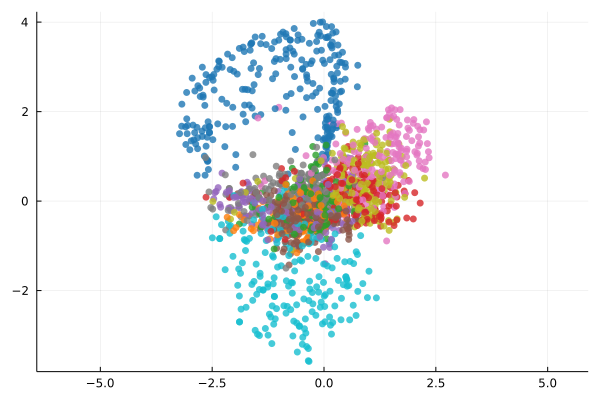

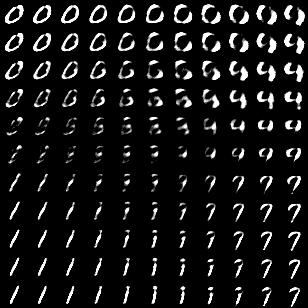

...

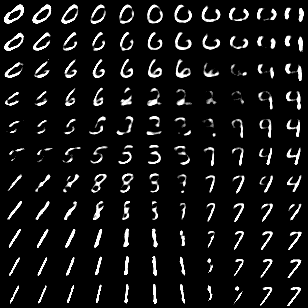

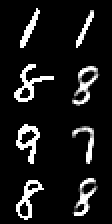

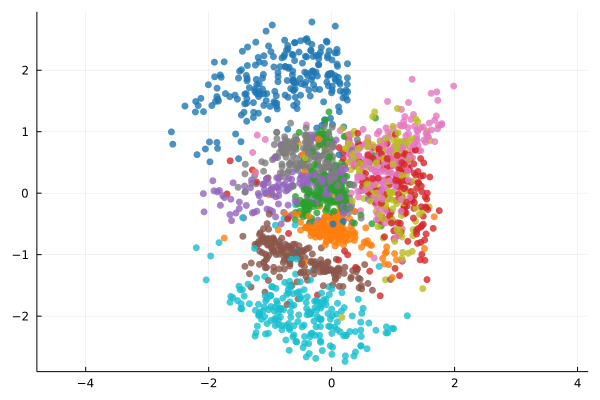

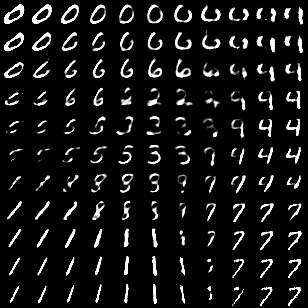

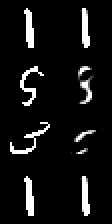

loss(data[1]) = 537.9391f0
loss(data[1]) = 162.45366f0
loss(data[1]) = 156.24925f0
loss(data[1]) = 150.05956f0
loss(data[1]) = 146.721f0
loss(data[1]) = 144.35577f0
loss(data[1]) = 142.83301f0
loss(data[1]) = 142.63853f0
loss(data[1]) = 140.08f0
loss(data[1]) = 140.0827f0
loss(data[1]) = 140.24643f0
loss(data[1]) = 138.05968f0
loss(data[1]) = 137.7911f0
loss(data[1]) = 138.96898f0
loss(data[1]) = 134.36826f0
loss(data[1]) = 134.46141f0
loss(data[1]) = 134.97249f0
loss(data[1]) = 139.65948f0


┌ Info: Epoch 1
└ @ Main In[36]:5
┌ Info: Epoch 2
└ @ Main In[36]:5
┌ Info: Epoch 3
└ @ Main In[36]:5
┌ Info: Epoch 4
└ @ Main In[36]:5
┌ Info: Epoch 5
└ @ Main In[36]:5
┌ Info: Epoch 6
└ @ Main In[36]:5
┌ Info: Epoch 7
└ @ Main In[36]:5
┌ Info: Epoch 8
└ @ Main In[36]:5
┌ Info: Epoch 9
└ @ Main In[36]:5
┌ Info: Epoch 10
└ @ Main In[36]:5
┌ Info: Epoch 11
└ @ Main In[36]:5
┌ Info: Epoch 12
└ @ Main In[36]:5
┌ Info: Epoch 13
└ @ Main In[36]:5
┌ Info: Epoch 14
└ @ Main In[36]:5
┌ Info: Epoch 15
└ @ Main In[36]:5
┌ Info: Epoch 16
└ @ Main In[36]:5
┌ Info: Epoch 17
└ @ Main In[36]:5
┌ Warning:  -> We're calling this converged.
└ @ Main In[36]:16


In [36]:
## @info("Beginning training loop...")
best_ls = Inf
last_improvement = 0
for epoch = 1:20
    @info "Epoch $epoch"
    global best_ls, last_improvement
    Flux.train!(loss, ps, zip(data), opt, cb=evalcb)
    ls = loss(data[1])
    display_plots()
    if ls <= best_ls
        BSON.@save "vae.bson" encoder μ lnσ decoder
        best_ls = ls
        last_improvement = epoch
    end
    if epoch - last_improvement >= 2
        @warn(" -> We're calling this converged.")
        break
    end
end

In [37]:
BSON.@load "vae.bson" encoder μ lnσ decoder 

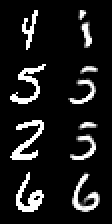

In [38]:
sample()

Obviously model could be much more complicated; we could made it deeper or use convolutional layers:

In [ ]:
Dz, Dh = 8, 128 #wymiary

In [ ]:
encoder =  Chain(x -> reshape(x, (28,28,1,size(x)[end])),
        Conv((3,3), 1=>32, pad = (1,1),relu),
        Conv((3,3), 32=>32, pad = (1,1), relu),
        MaxPool((2, 2)),
        Dropout(0.25),
        x -> reshape(x, :, size(x, 4)),
        Dense(6272, Dh)) |> device

μ = Dense(Dh, Dz) |> device

lnσ = Dense(Dh, Dz) |> device

z(μ, logσ) = μ + exp.(logσ) .* device(randn(Float32,size(logσ)))

decoder = Chain(Dense(Dz, Dh, relu),
        Dense(Dh,6272, relu),
        x -> reshape(x,(14,14,32,size(x)[end])),
        Dropout(0.25),
        x -> repeat(x, inner = [2,2,1,1]),
        ConvTranspose((3,3), 32=>32, pad = (1,1),relu),
        ConvTranspose((3,3), 32=>1, pad = (1,1)),
        x -> reshape(x, :, size(x, 4))
       ) |> device

In [ ]:
evalcb = throttle(() -> @show(loss(data[1])), 100)
opt = ADAM()
ps = params(encoder, μ, lnσ, decoder);

In [ ]:
@info("Beginning training loop...")
best_ls = Inf
last_improvement = 0
for epoch = 1:3
    @info "Epoch $epoch"
    display(sample())
    global best_ls, last_improvement
    Flux.train!(loss, ps, zip(data), opt, cb=evalcb)
    ls = loss(data[1])
    if ls <= best_ls
        BSON.@save "vaeCNN_MNIST.bson" encoder μ lnσ decoder
        best_ls = ls
        last_improvement = epoch
    end
    if epoch - last_improvement >= 2
        @warn(" -> We're calling this converged.")
        break
    end
end

In [ ]:
BSON.@load "vaeCNN_MNIST.bson" encoder μ lnσ decoder 

In [ ]:
sample()

## Extra Homework

1. Show that Kullback-Leibler divergence for two Normal distributions: $\mathcal{N}(\mu,\sigma)$ i $\mathcal{N}(0,1)$ is equal to:

$$d_{KL}(\mathcal{N}(\mu,\sigma)||\mathcal{N}(0,1)) = \frac{1}{2}(\sigma^2 + \mu^2  - 1 - 2\log\sigma) $$ <b>(5 points)</b>


2. Improve the quality of the presented model (the one which learn to embed the MNIST into the two-dimensional latent space). Then, train the same model, but without the regularization in a form of Kullback-Leibler divergence. What do you notice? <b>(8 points)</b>